## A Quick Overview of Reinforcement Learning

Learning a new skill can sometimes be daunting - maybe you read books, take a class, watch videos of people who already know - maybe you prefer to simply dive in and make a mess of things as you go, learning from the process. Similarly, there are a number of ways in which a computer can be taught a new skill. In the world of machine learning, reinforcement learning takes the approach of diving right in and trying things out to see how they go.

Core to reinforcement learning is the simulation of an environment and how it responds to a computer agent taking different actions in that environment. The agent is dropped into this environment, knowing nothing at all other than an algorithm that feeds it the state of the environment and gives it a numerical reward based on how the agent's previous actions have modified that environment, toward or away from a defined reward function.

As a basic example, picture a robot ant, given a physics-based environment and a simple goal of getting close to a single coordinate point in that environment - the closer the ant gets to that point, the greater a reward it receives. The reinfocement learning routine gives the ant an input state from the environment, known as the observables, and the ant chooses what next action to take - this is then fed back into the machinery for the next time-step, where the ant receives a reward for how well it progressed toward its ultimate goal.

The ant doesn't know gravity, doesn't understand how its limbs work, but does have a limited set of actions that it can take. Through a long series of policy-guided and random actions, trial and error, the ant runs through an entire scenario, or episode, to the point the environment declares the process done. Most likely at the start of the learning process, that episode ends early and because the ant fell over flailing. The ant is reset at the start of the scenario, with a new, fresh environment, asked to fulfill the task set out by the reward function that it's been given, with the one alteration: that it now has knowledge of what happened the in the past. The mapping of the environmental state to optimal action taken by the agent is slowly built through experience and some random noise applied to the action choice to ensure the ant doesn't sit around twirling its thumbs, thinking that's the best it can do. Given many hundreds of episodes and millions of simulated steps in time, the agent slowly builds a policy that chooses actions that maximize the reward it expects to receive for the entire episode, given past experience. And, eventually, hopefully, out comes an ant that can run.


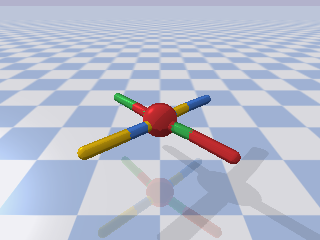

In [1]:
import IPython.display as ipd
ipd.Image("../animations/base_ant.png")

Clearly, the whole process has a lot more going on than the broad-strokes introduction above can cover.  To learn more about what reinfocement learning is and some of the fine details, we encourage the reader to check out the excellent introduction resource at https://spinningup.openai.com/en/latest/

What we are, instead, concerned with here is a more practical look at how to take an algorithm, plus an environment, and adjust them to your own specific needs and goals.  Specifically, we'll be taking the algorithm 'Twin Delayed Deep Deterministic Policy Gradients', or [TD3](https://github.com/sfujim/TD3), and using it to train a simulated robotic ant that is defined in PyBullet3's pre-built [environments](https://github.com/bulletphysics/bullet3/tree/master/examples/pybullet/gym/pybullet_envs).  You can read more about TD3 [here](https://spinningup.openai.com/en/latest/algorithms/td3.html), and we'll be working from a direct fork of the original author's git repo to skip questions about implementation.

Now lets look at some simple examples of training; we won't yet dive into the details of what's going on, but lets look at some general flow, supported by stable_baselines3, a package that has general algorithms implemented for us.  We'll start with the cart-pole example:

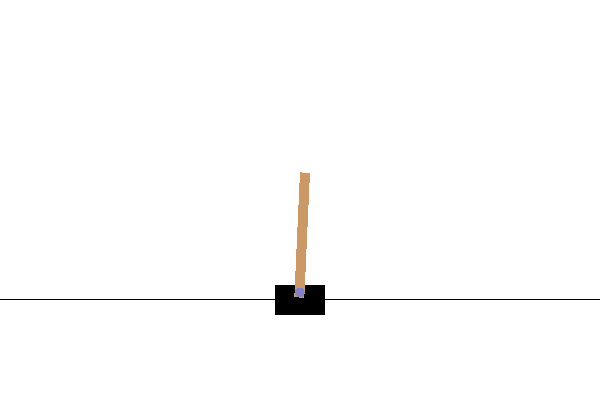

In [2]:
ipd.Image("images/cart_pole.gif")

In [ ]:
import gym
import numpy as np

from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.utils import set_random_seed

def make_env(env_id, rank, seed=0):
    """
    Utility function for multiprocessed env.

    :param env_id: (str) the environment ID
    :param num_env: (int) the number of environments you wish to have in subprocesses
    :param seed: (int) the inital seed for RNG
    :param rank: (int) index of the subprocess
    """
    def _init():
        env = gym.make(env_id)
        env.seed(seed + rank)
        return env
    set_random_seed(seed)
    return _init

if __name__ == '__main__':
    env_id = "CartPole-v1"
    num_cpu = 4  # Number of processes to use
    # Create the vectorized environment
    env = SubprocVecEnv([make_env(env_id, i) for i in range(num_cpu)])

    # Stable Baselines provides you with make_vec_env() helper
    # which does exactly the previous steps for you.
    # You can choose between `DummyVecEnv` (usually faster) and `SubprocVecEnv`
    # env = make_vec_env(env_id, n_envs=num_cpu, seed=0, vec_env_cls=SubprocVecEnv)

    model = PPO('MlpPolicy', env, verbose=1)
    model.learn(total_timesteps=25000)

    obs = env.reset()
    for _ in range(1000):
        action, _states = model.predict(obs)
        obs, rewards, dones, info = env.step(action)
        env.render()

And an environment for training a car to park in a desired parking space.

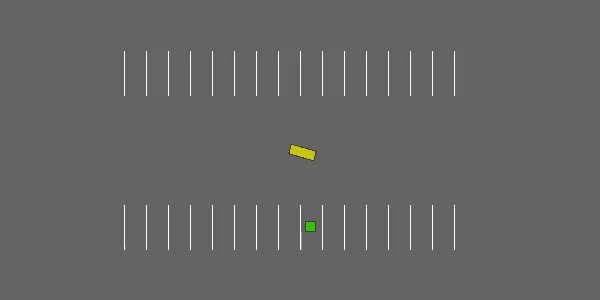

In [3]:
ipd.Image("images/parking-env.gif")

In [ ]:
import gym
import highway_env
import numpy as np

from stable_baselines3 import HerReplayBuffer, SAC, DDPG, TD3
from stable_baselines3.common.noise import NormalActionNoise

env = gym.make("parking-v0")

# Create 4 artificial transitions per real transition
n_sampled_goal = 4

# SAC hyperparams:
model = SAC(
    "MultiInputPolicy",
    env,
    replay_buffer_class=HerReplayBuffer,
    replay_buffer_kwargs=dict(
      n_sampled_goal=n_sampled_goal,
      goal_selection_strategy="future",
      # IMPORTANT: because the env is not wrapped with a TimeLimit wrapper
      # we have to manually specify the max number of steps per episode
      max_episode_length=100,
      online_sampling=True,
    ),
    verbose=1,
    buffer_size=int(1e6),
    learning_rate=1e-3,
    gamma=0.95,
    batch_size=256,
    policy_kwargs=dict(net_arch=[256, 256, 256]),
)

model.learn(int(2e5))
model.save("her_sac_highway")

# Load saved model
# Because it needs access to `env.compute_reward()`
# HER must be loaded with the env
model = SAC.load("her_sac_highway", env=env)

obs = env.reset()

# Evaluate the agent
episode_reward = 0
for _ in range(100):
    action, _ = model.predict(obs, deterministic=True)
    obs, reward, done, info = env.step(action)
    env.render()
    episode_reward += reward
    if done or info.get("is_success", False):
        print("Reward:", episode_reward, "Success?", info.get("is_success", False))
        episode_reward = 0.0
        obs = env.reset()
